In [1]:
using Plots
using DelimitedFiles
using Statistics
using Optim

In [2]:
struct Circle
    r::Float64
    x::Float64
    y::Float64
end

In [3]:
function batman(star, planet)
    # inputs: star, planet Circle structures
    # returns fraction of flux blocked from planet
    # basically copied from the batman paper on astro-ph

    d = sqrt((star.x-planet.x)^2 + (star.y - planet.y)^2)
    x = star.r
    rp = planet.r
    global A
    if (rp - d < x) & (rp + d > x)
        u = (d*d + x*x - rp*rp)/(2*d*x)
        u = min(u, 1) # because computers aren't perfect
        v = (d*d + rp*rp - x*x)/(2*d*rp)
        v = min(v, 1) # because computers aren't perfect
        w = (-d + x + rp)*(d + x - rp)*(d - x + rp)*(d + x + rp)
        w = max(w, 0) # because computers aren't perfect
        A = x*x *acos(u) + rp*rp*acos(v) - 0.5*sqrt(w)
    elseif x<= rp - d
        A = pi*x*x
    elseif x>= rp + d
        A = pi*rp*rp
    else
        error("unhandled case in batman!! (dont think this can happen...)")
    end
    return A
end

batman (generic function with 1 method)

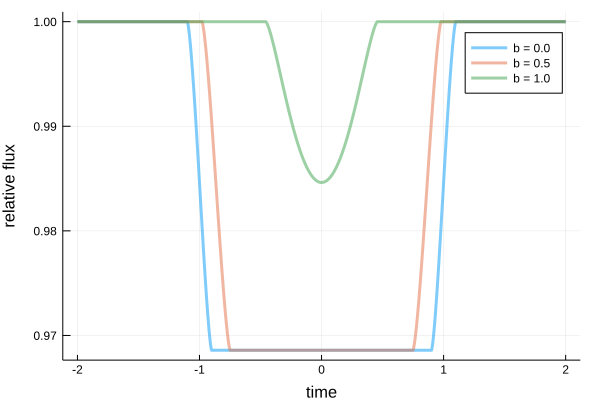

In [4]:
starRad = 1;
planetRad = starRad / 10;

star = Circle(starRad, 0, 0);
starY = [0, 0.5, 1] # impact parameter;
starX = -2:.001:2;
for sy in starY
    flux = zeros(length(starX))
    for (ii, x) in enumerate(starX)
        planet = Circle(planetRad, x, sy)
        flux[ii] = 1 - batman(star, planet)
    end
    if sy == 0
        global plt = plot(starX, flux, lw=3, plot_title="r_p = 0.1*r_star, no limb darkening", ylabel="relative flux", xlabel="time", label="b = $sy", alpha=0.5, markersize=1)
    else
        plot!(starX, flux, lw=3, label="b = $sy", alpha=0.5, markersize=1)
    end
end
display(plt)

In [5]:
function linLimb(rStar,  coeffs)
    # rStar from 0-1
    # 0 < c1, c2 < 1
    mu = sqrt.(1 .- rStar.^2)
    I = (1 .- coeffs[1].*(1 .- mu))
    return I
end

function quadLimb(rStar,  coeffs)
    # rStar from 0-1
    # 0 < c1, c2 < 1
    mu = sqrt.(1 .- rStar.^2)
    I = (1 .- coeffs[1].*(1 .- mu) .- coeffs[2].*(1 .- mu).^2)
    return I
end

function sqrtLimb(rStar,  coeffs)
    # rStar from 0-1
    # 0 < c1, c2 < 1
    mu = sqrt.(1 .- rStar.^2)
    I = (1 .- coeffs[1].*(1 .- mu) .- coeffs[2].*(1 .- mu.^2))
    return I
end

function expLimb(rStar,  coeffs)
    # rStar from 0-1
    # 0 < c1, c2 < 1
    mu = sqrt.(1 .- rStar.^2)
    I = (1 .- coeffs[1].*(1 .- mu) .- coeffs[2]./(1 .- exp.(mu)))
    return I
end

limbList = [linLimb, quadLimb, sqrtLimb, expLimb];

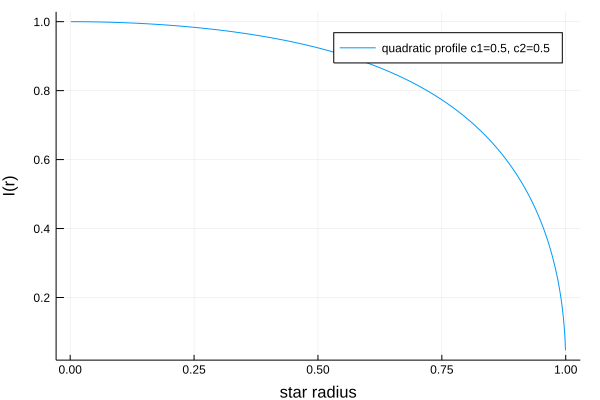

In [6]:
nDisks = 1000;
limbRs = LinRange(0, starRad, nDisks); # I use linear, batman uses a smarter slicing scheme
limbRs = limbRs[2:end]; # don't use r=0!
midPointRs = (limbRs[2:end] .+ limbRs[1:end-1]) ./ 2; # compute I(r) at midpoints
limbIs = quadLimb(midPointRs, [0.5, 0.5]);

# plot the limb dark model
plot(midPointRs, limbIs, label="quadratic profile c1=0.5, c2=0.5", ylabel="I(r)", xlabel="star radius")

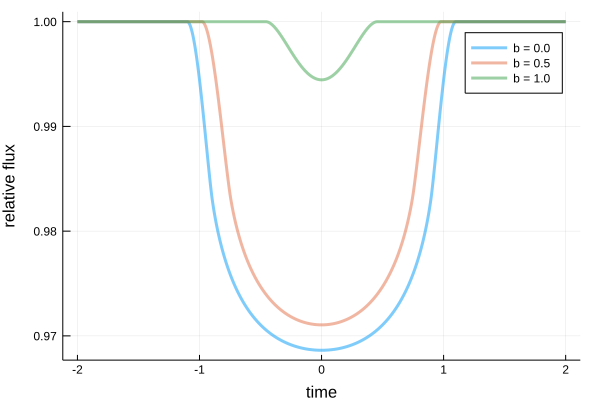

In [7]:
for sy in starY
    flux = zeros(length(starX))
    for (ii, x) in enumerate(starX)
        planet = Circle(planetRad, x, sy)
        shellFluxes = zeros(length(limbRs))
        for (i,starRad) in enumerate(limbRs)
            star = Circle(starRad, 0, 0)
            flux_i = batman(star, planet)
            shellFluxes[i] = flux_i
        end
        dShell = shellFluxes[2:end] - shellFluxes[1:end-1]
        flux[ii] = 1 - sum(limbIs .* dShell)
    end

    if sy == 0
        global plt = plot(starX, flux, lw=3, plot_title="r_p = 0.1*r_star, quadratic limb darkening c1=0.5 c2=0.5", ylabel="relative flux", xlabel="time", label="b = $sy", alpha=0.5, markersize=1)
    else
        plot!(starX, flux, lw=3, label="b = $sy", alpha=0.5, markersize=1)
    end
end
display(plt)

In [8]:
function foldAndSortByTime(modTime, ts, flux)
    # return a folded time series time, flux
    ts = ts .% modTime # wrap time
    sortInds = sortperm(ts)
    ts = ts[sortInds]
    flux = flux[sortInds]
    return ts, flux
end

function sumMinDist(flux)
    v1 = flux[1:end-1]
    v2 = flux[2:end]
    dv = v2 .- v1
    # compute array of successive distances
    return sum(dv.^2)
end

function periodSearch(ts, flux, minTime, maxTime)
    # a brute force approach
    # returns: bestPeriod, folded time vector, velocity vector
    timeStep = .00001 # days
    foldTimes = minTime:timeStep:maxTime
    minMetric = 1e16
    bestP = -1 # period init
    bestT = ts # times
    bestF = flux # velocities
    for (i, tryP) in enumerate(foldTimes)
        tryT, tryV = foldAndSortByTime(tryP, ts, flux)
        metric = sumMinDist(tryV)
        if metric < minMetric
            minMetric = metric
            bestT = tryT
            bestF = tryV
            bestP = tryP
        end
    end
    return bestP, bestT, bestF
end

periodSearch (generic function with 1 method)

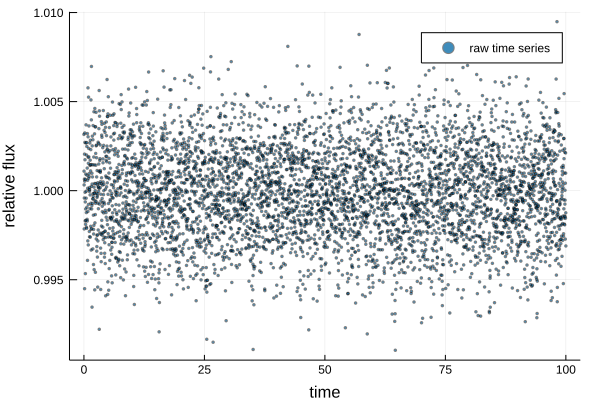

In [9]:
mp = readdlm("mystery_planet02.txt")
ts = mp[:,1];
flux = mp[:,2];
fluxErr = mp[:,3];
plot(ts, flux, label="raw time series", ylabel="relative flux", xlabel="time", seriestype=:scatter, alpha=0.5, markersize=1)

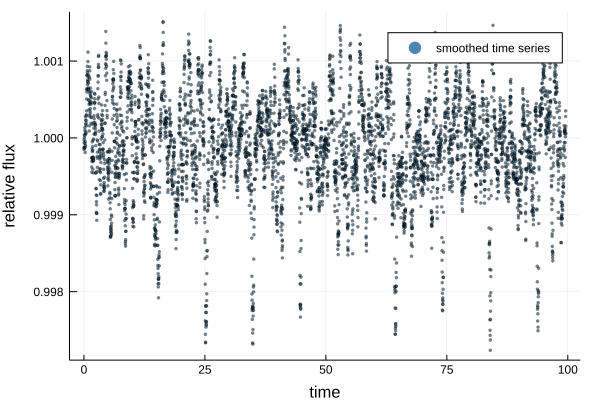

In [10]:
function movingAverage(ts, flux, width)
    newFlux = zeros(length(flux)-width)
    newT = zeros(length(newFlux))
    for i in 1:length(newFlux)
        newT[i] = ts[i]
        edge1 = i
        edge2 = i+width
        newFlux[i] = mean(flux[edge1:edge2])
    end
    return newT, newFlux
end
tsSmooth, fluxSmooth = movingAverage(ts, flux, 20)
plot(tsSmooth, fluxSmooth, label="smoothed time series", ylabel="relative flux", xlabel="time", seriestype=:scatter, alpha=0.5, markersize=1)

In [11]:
period, tsFold, fluxFold = periodSearch(ts, flux, 9.5, 10.5)

print("best period $period days\n")

best period 9.80797 days


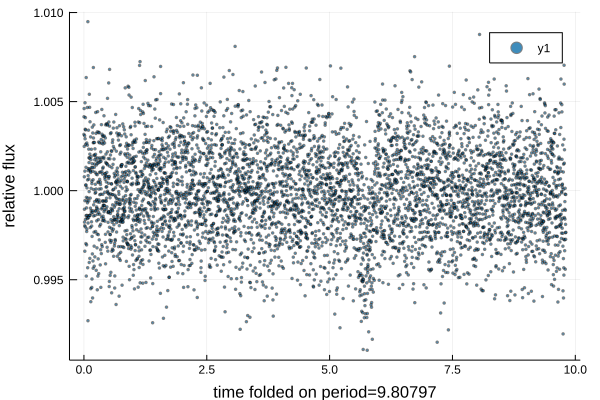

In [12]:
# plot the folded timeseries
plot(tsFold, fluxFold, ylabel="relative flux", xlabel="time folded on period=$period", seriestype=:scatter, alpha=0.5, markersize=1)


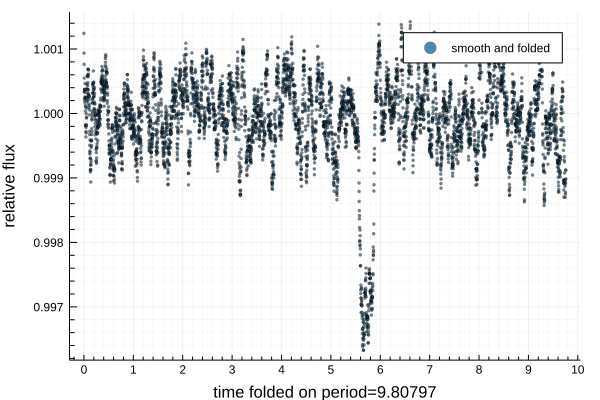

In [13]:
tsSmooth, fluxSmooth = movingAverage(tsFold, fluxFold, 25)

plot(tsSmooth, fluxSmooth, minorgrid=true, xminorticks=0:.25:10, xticks=0:1:10, label="smooth and folded", ylabel="relative flux", xlabel="time folded on period=$period", seriestype=:scatter, alpha=0.5, markersize=1)


In [14]:
function transitModel(tVec, P, t_o, T, b, r_p, limbModel, coeffs)
    # tVec = vector of times at which to compute transit
    # P = period
    # t_o = midpoint in time of transit, from time=0 (modulo period!)
    # T = transit duration (1st to 4th contact)
    # b = impact parameter (fraction of star's radius)
    # r_p = planet's radius (as a fraction of star's radius)
    # limbModel = an integer from 0-4 indicating which limb profile to use
    #              0 = uniform (no limb darkening)
    #              1 = linear (coeff2 is ignored)
    #              2 = quadratic
    #              3 = sqrt
    #              4 = exponential
    # coeffs = list of coefficients to pass to limb darkening models (ignored for
    #           limbModel = 0, the uniform case)

    # returns vector of modeled flux values relative to 1

    # first wrap tVec on period P
    tVec = tVec .% P

    starRad = 1 # radius of star is always taken to be 1


    # based on T, duration of transit, determine the scaling between
    # position of the planet and time
    xContact = sqrt((starRad+r_p)^2 - (starRad*b)^2)
    xLength = 2*xContact
    # turn this in to a velocity dx/dt
    v = xLength / T

    # rescale all points in tVec to x, and center at t_o (center of transit at x = 0)
    # now x vec is relative to star x center for a single transit
    xVec = (tVec .- t_o) .* v

    fluxVec = zeros(length(xVec))
    for (ii, planetX) in enumerate(xVec)
        planet = Circle(r_p, planetX, b)
        if limbModel == 0
            # no limb darkening
            star = Circle(1, 0, 0)
            fluxVec[ii] = 1 - batman(star, planet)
        else
            # yes limb darkening
            limbIs = limbList[limbModel](midPointRs, coeffs)
            shellFluxes = zeros(length(limbRs))
            for (i,starRad) in enumerate(limbRs) # avoid r=0
                star = Circle(starRad, 0, 0)
                shellFluxes[i] = batman(star, planet)
            end
            dShell = shellFluxes[2:end] - shellFluxes[1:end-1]
            fluxVec[ii] = 1 - sum(limbIs .* dShell)
        end
    end
    return fluxVec
end

transitModel (generic function with 1 method)

In [15]:
### next come up with some good guesses for our model fit
# set t_o to be the median value in the smoothed folded data
# for values < 0.998
transitInds = fluxSmooth .< 0.998
tZoom = tsSmooth[transitInds]
t_o = median(tZoom)

# initial guess for depth of transit, take the upper quartile
fZoom = fluxSmooth[transitInds]
depth = quantile(fZoom, 0.75)
# convert depth into initial guess for planet radius r_p (fraction of star radius=1)
rStar = 1
r_p = sqrt(rStar^2*(1 - depth))
print("transit depth $depth\n")
print("r_p $r_p\n")

# estimate transit duration from visual inspection of plot
T = 0.4 # total transit duration
tao = 0.1 # ingress/egress duration

# finally estimate the impact parameter
b_o = sqrt(1 - r_p*T/tao);

transit depth 0.9973192081019812
r_p 0.05177636427964831


chi2 first guess: 0.04349949228792599


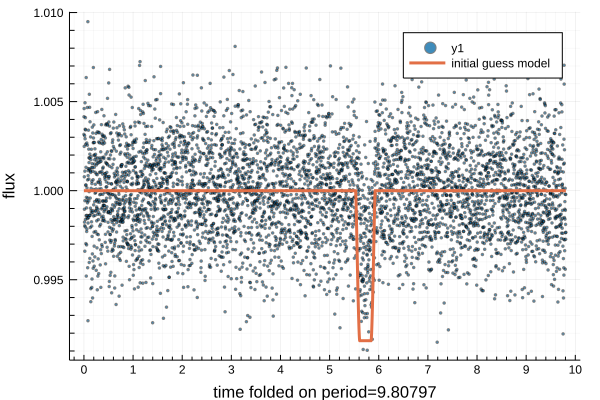

In [16]:
tModel = transitModel(tsFold, period, t_o, T, b_o, r_p, 0, nothing)
chi2 = sum((tModel .- flux).^2)
print("chi2 first guess: $chi2\n")
plot(tsFold, fluxFold, minorgrid=true, xminorticks=0:.25:10, xticks=0:1:10, ylabel="flux", xlabel="time folded on period=$period", seriestype=:scatter, alpha=0.5, markersize=1)
plot!(tsFold, tModel, lw=3, label="initial guess model")


In [17]:
# define a struct for keeping track of params
struct Params
    period
    t_o
    T
    b
    r_p
    limbModel
    limbModelCoeff
    chi2
end

function printParams(params)
    p = params.period
    T = params.T
    b = params.b
    r_p = params.r_p
    depth = 1 - r_p^2
    lNames = ["Linear", "Quadratic", "Sqrt", "Exp"]
    if params.limbModel == 0
        lName = "None"
    else
        lName = lNames[params.limbModel]
    end
    coeff = params.limbModelCoeff
    chi2 = params.chi2
    print("-----------------------------\n")
    print("Fitted Results chi2=$chi2\n")
    print("Limb Dark Model: $lName with coeffs: $coeff\n")
    print("period: $p\n")
    print("duration (first to last contact): $T\n")
    print("impact parameter: $b\n")
    print("planet radius (over rStar): $r_p\n")
    print("depth: $depth\n")
    G = 32 / (pi*3.46e-3) # from seager paper
    starDensity = 3 / (pi*pi)*p/(G*T^3)*(1-b^2)^(3/2)
    print("stellar density: $starDensity\n")
    print("-----------------------------\n")
end

print("Transit Parameters from first guess:\n")
bestParams = Params(period,t_o,T,b_o,r_p,0,0,chi2) # initial guess
printParams(bestParams)

Transit Parameters from first guess:
-----------------------------
Fitted Results chi2=0.04349949228792599
Limb Dark Model: None with coeffs: 0
period: 9.80797
duration (first to last contact): 0.4
impact parameter: 0.8904462605241299
planet radius (over rStar): 0.05177636427964831
depth: 0.9973192081019812
stellar density: 0.0014913650835980336
-----------------------------


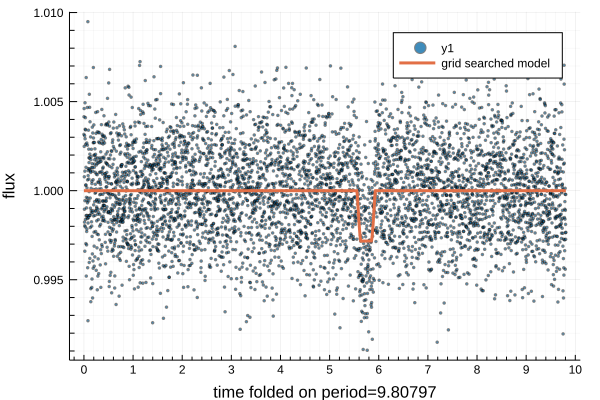

Best found transist fit from grid search in neighborhood of first guess
-----------------------------
Fitted Results chi2=0.031950006419136166
Limb Dark Model: None with coeffs: 0
period: 9.80797
duration (first to last contact): 0.38
impact parameter: 0.9416666666666667
planet radius (over rStar): 0.03
depth: 0.9991
stellar density: 0.0007034982879281952
-----------------------------


In [18]:
t_oRange = LinRange(5.7, 5.8, 15)
TRange = LinRange(0.38, 0.41, 10)
b_oRange = LinRange(0.8, 1, 25)
r_pRange = LinRange(0.03, 0.1, 25)

for to in t_oRange
    for T in TRange
        for b in b_oRange
            for rp in r_pRange
                tModel = transitModel(ts, period, to, T, b, rp, 0, nothing)
                chi2 = sum((tModel .- flux).^2)
                if chi2 < bestParams.chi2
                    global bestParams
                    bestParams = Params(period, to, T, b, rp, 0, 0, chi2)
                end
            end
        end
    end
end

print("Best found transist fit from grid search in neighborhood of first guess\n")
printParams(bestParams)

tModel = transitModel(tsFold, bestParams.period, bestParams.t_o, bestParams.T, bestParams.b, bestParams.r_p, 0, nothing)
plt = plot(tsFold, fluxFold, minorgrid=true, xminorticks=0:.25:10, xticks=0:1:10, ylabel="flux", xlabel="time folded on period=$period", seriestype=:scatter, alpha=0.5, markersize=1)
plot!(tsFold, tModel, lw=3, label="grid searched model")
display(plt)

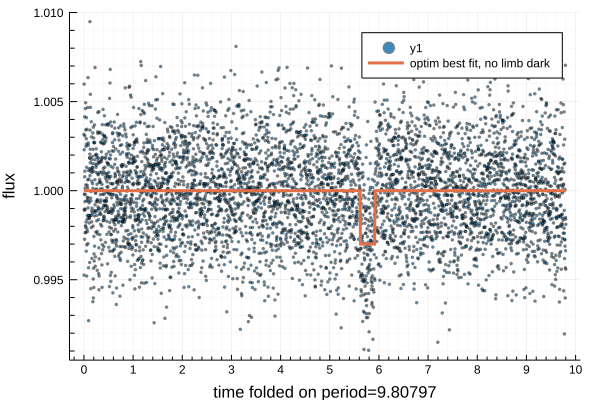

Optim minimum, without limb darkening
-----------------------------
Fitted Results chi2=0.0318733627217486
Limb Dark Model: None with coeffs: 0
period: 9.80381570976229
duration (first to last contact): 0.3060803864457404
impact parameter: 0.035643541589678335
planet radius (over rStar): 0.03089007136763902
depth: 0.9990458034909022
stellar density: 0.03523367793210189
-----------------------------


In [19]:
function minimizeModel(x)
    period = abs(x[1])
    t_o = abs(x[2])
    T = abs(x[3])
    b = min(1, abs(x[4]))
    r_p = min(1, abs(x[5]))
    tModel = transitModel(ts, period, t_o, T, b, r_p, 0, nothing)
    chi2 = sum((tModel .- flux).^2)
    return chi2
end

x_o = [bestParams.period, bestParams.t_o, bestParams.T, bestParams.b, bestParams.r_p]


out = optimize(minimizeModel, x_o)
bestFitChi2 = Optim.minimum(out)
bestFit = Optim.minimizer(out)

best_period = bestFit[1]
best_t_o = bestFit[2]
best_T = bestFit[3]
best_b = bestFit[4]
best_r_p = bestFit[5]

bestParams = Params(best_period, best_t_o, best_T, best_b, best_r_p, 0, 0, bestFitChi2)
print("Optim minimum, without limb darkening\n")
printParams(bestParams)
# fold on newfound period
tsFold, fluxFold = foldAndSortByTime(bestParams.period, ts, flux)
tModel = transitModel(tsFold, bestParams.period, bestParams.t_o, bestParams.T, bestParams.b, bestParams.r_p, 0, nothing)
plt = plot(tsFold, fluxFold, minorgrid=true, xminorticks=0:.25:10, xticks=0:1:10, ylabel="flux", xlabel="time folded on period=$period", seriestype=:scatter, alpha=0.5, markersize=1)
plot!(tsFold, tModel, lw=3, label="optim best fit, no limb dark")
display(plt)


In [20]:
limbModel = 2 # corresponds to quadratic

function minimizeModelWithQuadLimb(x)
    period = abs(x[1])
    t_o = abs(x[2])
    T = abs(x[3])
    b = min(1, abs(x[4]))
    r_p = min(1, abs(x[5]))
    c1 = min(1, abs(x[6]))
    c2 = min(1, abs(x[7]))
    tModel = transitModel(ts, period, t_o, T, b, r_p, limbModel, [c1, c2])
    chi2 = sum((tModel .- flux).^2)
    return chi2
end

x_o = [bestParams.period, bestParams.t_o, bestParams.T, bestParams.b, bestParams.r_p, 0, 0]


out = optimize(minimizeModelWithQuadLimb, x_o)
bestFitChi2 = Optim.minimum(out)
bestFit = Optim.minimizer(out)

best_period = bestFit[1]
best_t_o = bestFit[2]
best_T = bestFit[3]
best_b = bestFit[4]
best_r_p = bestFit[5]
c1 = abs(bestFit[6])
c2 = abs(bestFit[7])

bestParams = Params(best_period, best_t_o, best_T, best_b, best_r_p, limbModel, [c1, c2], bestFitChi2)
print("Optim minimum, with quadratic limb darkening\n")
printParams(bestParams)



Optim minimum, with quadratic limb darkening
-----------------------------
Fitted Results chi2=0.03187291686852015
Limb Dark Model: Quadratic with coeffs: [0.025, 0.0]
period: 9.80381570976229
duration (first to last contact): 0.3060803864457404
impact parameter: 0.035643541589678335
planet radius (over rStar): 0.03089007136763902
depth: 0.9990458034909022
stellar density: 0.03523367793210189
-----------------------------


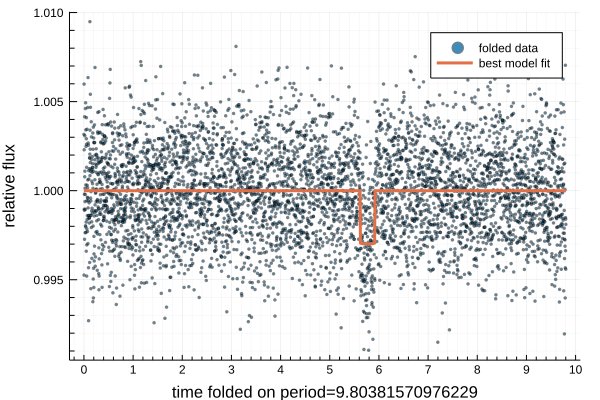

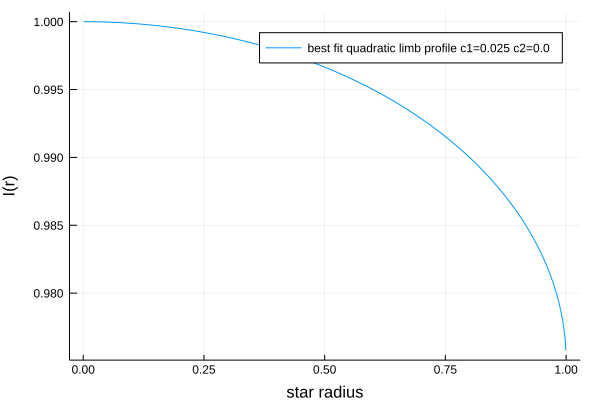

In [21]:
tsFold, fluxFold = foldAndSortByTime(bestParams.period, ts, flux)

tModel = transitModel(tsFold, bestParams.period, bestParams.t_o, bestParams.T, bestParams.b, bestParams.r_p, limbModel, [c1, c2])
plt = plot(tsFold, fluxFold, minorgrid=true, xminorticks=0:.25:10, xticks=0:1:10, label="folded data", ylabel="relative flux", xlabel="time folded on period=$best_period", seriestype=:scatter, alpha=0.5, markersize=1)
plot!(tsFold, tModel, label="best model fit", lw=3)
display(plt)

# quadritic profile
# plot the limb dark model
limbIs = quadLimb(midPointRs, [c1, c2])
plot(midPointRs, limbIs, label="best fit quadratic limb profile c1=$c1 c2=$c2", ylabel="I(r)", xlabel="star radius")
